## Epileptic Seizure Recognition Data Set 

The original dataset from the reference consists of 5 different folders, each with 100 files, with each file representing a single subject/person. Each file is a recording of brain activity for 23.6 seconds. The corresponding time-series is sampled into 4097 data points. Each data point is the value of the EEG recording at a different point in time. So we have total 500 individuals with each has 4097 data points for 23.5 seconds.

We divided and shuffled every 4097 data points into 23 chunks, each chunk contains 178 data points for 1 second, and each data point is the value of the EEG recording at a different point in time. So now we have 23 x 500 = 11500 pieces of information(row), each information contains 178 data points for 1 second(column), the last column represents the label y {1,2,3,4,5}. 

The response variable is y in column 179, the Explanatory variables X1, X2, ..., X178 

y contains the category of the 178-dimensional input vector. Specifically y in {1, 2, 3, 4, 5}: 

5 - eyes open, means when they were recording the EEG signal of the brain the patient had their eyes open 

4 - eyes closed, means when they were recording the EEG signal the patient had their eyes closed 

3 - Yes they identify where the region of the tumor was in the brain and recording the EEG activity from the healthy brain area 

2 - They recorded the EEG from the area where the tumor was located 

**1 - Recording of seizure activity (This is epileptic seizure)**

All subjects falling in classes 2, 3, 4, and 5 are subjects who did not have epileptic seizure. Only subjects in class 1 have epileptic seizure. Our motivation for creating this version of the data was to simplify access to the data via the creation of a .csv version of it. Although there are 5 classes most authors have done binary classification, namely class 1 (Epileptic seizure) against the rest.

EEG signals are separated into α, β, δ and θ spectral components and provide a wide range of frequency components. EEG spectrum contains some characteristic waveforms that fall primarily within four frequency bands as follows: δ(0.5-4 Hz), θ(4-8 Hz), α(8-12 Hz), and β (12- 30 Hz)

![title](brain_waves.png)

***Acknowledgements
Andrzejak RG, Lehnertz K, Rieke C, Mormann F, David P, Elger CE (2001) Indications of nonlinear deterministic and finite dimensional structures in time series of brain electrical activity: Dependence on recording region and brain state, Phys. Rev. E, 64, 061907 ***

## In this project we attempt to classify the discrete categorical bins for each of the y labels 1,2,3,4,5. In order to do this, we believe a signal processing engineering approach would be granular enough to do a finer classification. Most other projects perform binary classification between y = 1 and the rest of the labels. 

## However if the classification is simply a binary decision of epileptic or not epileptic, then there is not a real need to use a signal processing approach. 

## The Machine Learning part of this project shall use the binary approach and then attempt to do a finer granular multi classification approach using parameters from engineering signal processing.

### As the dataset was already pre processed and do not contain null values or erroneous typed values, we immediately proceeded to import the data and do the actual work.

In [32]:
import math
import numpy as np
import scipy as sp
import sklearn
import xgboost
import graphviz
import sklearn.metrics as metrik
from sklearn import datasets
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
from sklearn.tree import export_graphviz
from scipy import fftpack
from scipy.signal import find_peaks, peak_prominences
from scipy.signal import butter, filtfilt
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.multiclass import OneVsRestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.datasets import load_iris
from sklearn.metrics import accuracy_score
from xgboost.sklearn import XGBClassifier
from vecstack import stacking
from sklearn import datasets
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)
%matplotlib inline
print('sklearn: %s' % sklearn.__version__)    
import warnings
warnings.filterwarnings("ignore")



epilepsyDF = pd.read_csv('data.csv', index_col=0)

ML_DF = pd.read_csv('My_ML_DF.csv', index_col=0)

# shuffle the original data rows from the csv file
# epilepsyDF = epilepsyDF.sample(frac=1)

binaryML_DF = epilepsyDF.copy(deep = True)



# Check for missing values, nulls, NaNs as part of initial pre processing work. Very important!
an = epilepsyDF.isnull().sum()
if len(an[an > 0]) > 0 :
    print("Data needs cleansing")
else :
    print("CSV Data is cleansed")
    
am = ML_DF.isnull().sum()
if len(am[am > 0]) > 0 :
    print("ML Data needs cleansing")
else :
    print("Engineering Data is cleansed")
    
# sns.heatmap(epilepsyDF.isnull(), yticklabels=False, cbar=False)

print()
print(epilepsyDF.head(4))
print(ML_DF.head(4))
    
# Create a new Dataframe to contain the list of calculated extracted features from the
# original dataset. Call it MyDF

# column_names = ["YLabel", "Mean", "SD", "Variance", "RMS", "ZeroXings", "TPeaks", "TMax1", "TMax2", "TMax3", "FPeaks", "FMax1", "FMax2", "FMax3"]
# MyDF = pd.DataFrame(columns = column_names)


# print(epilepsyDF.shape)
# print(epilepsyDF.dtypes)
# print(epilepsyDF.index)

# print(type(epilepsyDF.index))
# print(type(epilepsyDF.columns))
# print(type(epilepsyDF.values))

# print(epilepsyDF['y'])
# print(epilepsyDF[['X1', 'y']])
# print(type1_DF.iloc[:5, 0:2])


### Remove the y classification label column because these dataframes are used for actual calculations.
### y label column not required

# Type 1 Epilepsy ######
type1 = epilepsyDF['y'] == 1
type1_DF = epilepsyDF[type1]
type1_DF = type1_DF.drop(labels='y', axis=1) 
# print(type1_DF)
# ######################

# Type 2 Epilepsy ######
type2 = epilepsyDF['y'] == 2
type2_DF = epilepsyDF[type2]
type2_DF = type2_DF.drop(labels='y', axis=1)
# print(type2_DF)
# ######################

# Type 3 Epilepsy ######
type3 = epilepsyDF['y'] == 3
type3_DF = epilepsyDF[type3]
type3_DF = type3_DF.drop(labels='y', axis=1) 
# print(type3_DF)
# ######################

# Type 4 Epilepsy ######
type4 = epilepsyDF['y'] == 4
type4_DF = epilepsyDF[type4]
type4_DF = type4_DF.drop(labels='y', axis=1) 
# print(type4_DF)
# ######################

# Type 5 Epilepsy ######
type5 = epilepsyDF['y'] == 5
type5_DF = epilepsyDF[type5]
type5_DF = type5_DF.drop(labels='y', axis=1) 
# print(type5_DF)
# ######################

sklearn: 0.21.3
CSV Data is cleansed
Engineering Data is cleansed

             X1   X2   X3   X4   X5   X6   X7   X8   X9  X10  X11  X12  X13  \
X21.V1.791  135  190  229  223  192  125   55   -9  -33  -38  -10   35   64   
X15.V1.924  386  382  356  331  320  315  307  272  244  232  237  258  212   
X8.V1.1     -32  -39  -47  -37  -32  -36  -57  -73  -85  -94  -99  -94  -96   
X16.V1.60  -105 -101  -96  -92  -89  -95 -102 -100  -87  -79  -72  -68  -74   

            X14  X15  X16  X17   X18   X19   X20  X21  X22  X23  X24  X25  \
X21.V1.791  113  152  164  127    50   -47  -121 -138 -125 -101  -50   11   
X15.V1.924    2 -267 -605 -850 -1001 -1109 -1090 -967 -746 -464 -152  118   
X8.V1.1    -104 -103  -92  -75   -69   -69   -53  -37  -14  -10  -39  -78   
X16.V1.60   -80  -83  -73  -68   -61   -58   -59  -64  -79  -84  -97  -94   

            X26  X27  X28  X29  X30  X31  X32  X33  X34  X35  X36  X37  X38  \
X21.V1.791   39   24   48   64   46   13  -19  -61  -96 -130 -132 -116 -

The are 2300 records for each class Types 1-5 in the given dataset
The number for the epileptic class (1) is 2300
The number for the non-seizure class (2-5) is 9200
Indeed each class type has 2300 recordings

5    2300
4    2300
3    2300
2    2300
1    2300
Name: y, dtype: int64


Type 1 overview Stats


,count,mean,std,min,25%,50%,75%,max
X1,2300.0,-21.936522,342.361939,-1839.0,-193.25,-16.0,159.00,1314.0
X2,2300.0,-19.049130,343.398782,-1838.0,-191.25,-18.0,168.25,1356.0
X3,2300.0,-15.293913,337.489643,-1835.0,-187.00,-12.5,169.25,1274.0
X4,2300.0,-9.836087,332.354833,-1845.0,-184.00,-6.0,166.25,1226.0
X5,2300.0,-3.707391,332.211163,-1791.0,-174.25,-12.0,170.00,1518.0
...,...,...,...,...,...,...,...,...
X175,2300.0,-25.830870,339.650467,-1863.0,-195.00,-14.5,153.25,1205.0
X176,2300.0,-25.043913,335.747017,-1781.0,-192.00,-18.0,150.00,1371.0
X177,2300.0,-24.548261,335.244512,-1727.0,-190.25,-21.5,151.25,1445.0
X178,2300.0,-24.016522,339.819309,-1829.0,-189.00,-23.0,157.25,1380.0


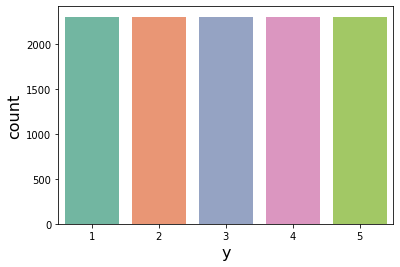

In [33]:
ax = sns.countplot(epilepsyDF['y'], palette="Set2")

print('The are 2300 records for each class Types 1-5 in the given dataset')
print('The number for the epileptic class (1) is 2300')
print('The number for the non-seizure class (2-5) is 9200')
print('Indeed each class type has 2300 recordings')
print('')
print(epilepsyDF['y'].value_counts())
print('')
print('')
print('Type 1 overview Stats')
epilepsyDF[epilepsyDF['y'] == 1].describe().T

### Scatter plots for all Epileptic Types 1-5

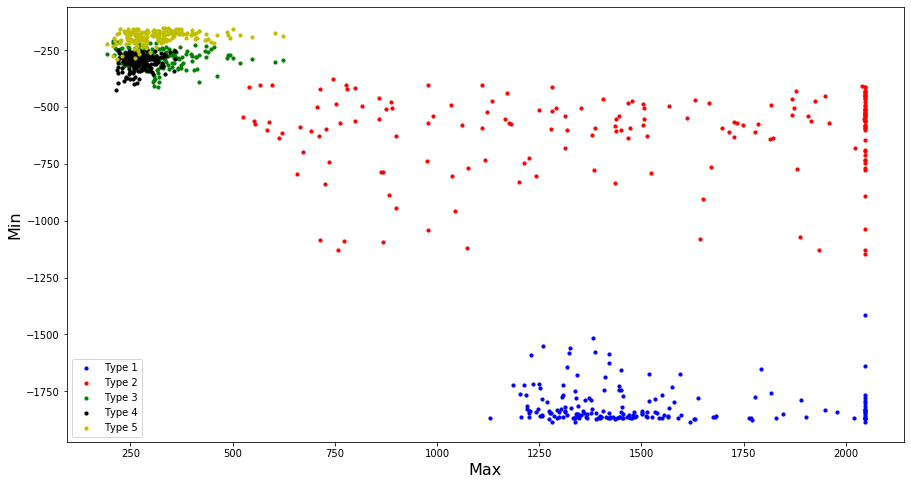

In [34]:
# Extract each of the Types and place the values into an array of arrays
type1 = [epilepsyDF[epilepsyDF['y'] == 1].iloc[:, range(0, len(epilepsyDF.columns) - 1)].values]
type2 = [epilepsyDF[epilepsyDF['y'] == 2].iloc[:, range(0, len(epilepsyDF.columns) - 1)].values]
type3 = [epilepsyDF[epilepsyDF['y'] == 3].iloc[:, range(0, len(epilepsyDF.columns) - 1)].values]
type4 = [epilepsyDF[epilepsyDF['y'] == 4].iloc[:, range(0, len(epilepsyDF.columns) - 1)].values]
type5 = [epilepsyDF[epilepsyDF['y'] == 5].iloc[:, range(0, len(epilepsyDF.columns) - 1)].values]


x1, y1 = np.max(type1, axis = 1), np.min(type1, axis = 1)
x2, y2 = np.max(type2, axis = 1), np.min(type2, axis = 1)
x3, y3 = np.max(type3, axis = 1), np.min(type3, axis = 1)
x4, y4 = np.max(type4, axis = 1), np.min(type4, axis = 1)
x5, y5 = np.max(type3, axis = 1), np.min(type5, axis = 1)



fig = plt.figure(figsize=(15, 8))
ax1 = fig.add_subplot(111)

ax1.scatter(x1, y1, s=10, c = 'b', label = "Type 1")
ax1.scatter(x2, y2, s=10, c = 'r', label = "Type 2")
ax1.scatter(x3, y3, s=10, c = 'g', label = "Type 3")
ax1.scatter(x4, y4, s=10, c = 'k', label = "Type 4")
ax1.scatter(x5, y5, s=10, c = 'y', label = "Type 5")

plt.legend();
plt.xlabel("Max")
plt.ylabel("Min")
plt.show()

### Heatmap for Correlation

Text(0.5, 0.98, 'Engineering Parameters Correlation Heatmap')

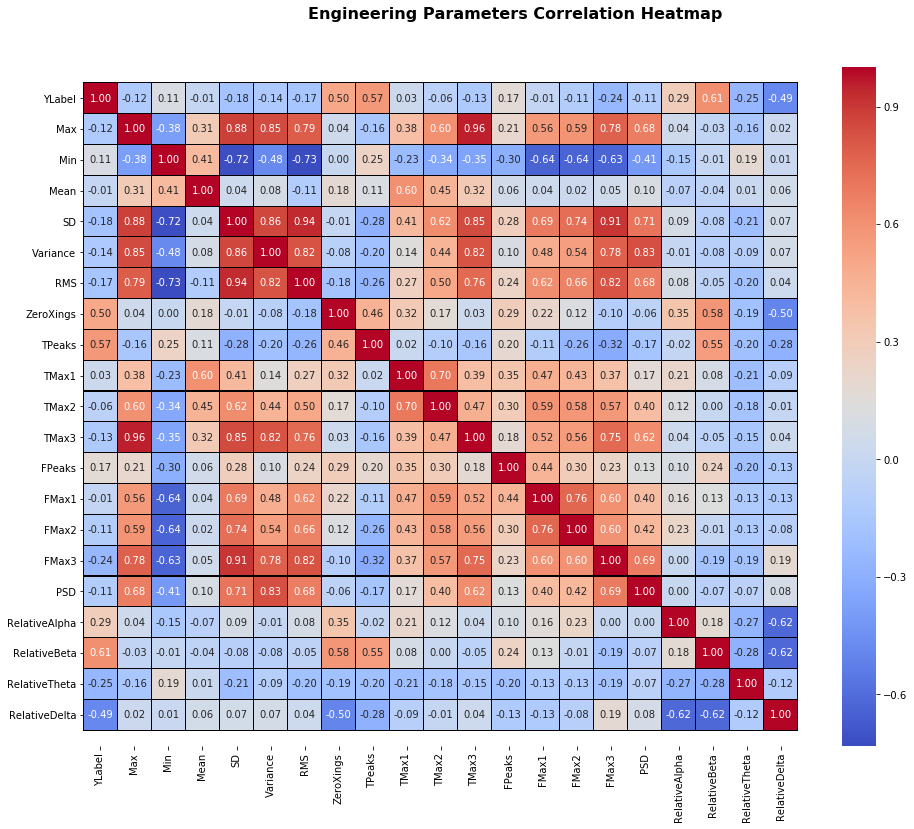

In [35]:
# Type 1 is very easily classified so we remove them
cond = ML_DF['YLabel'] >= 2

ML_DF_MODCORR = ML_DF[cond]

ML_DF_Corr = ML_DF_MODCORR.corr()

fig, (ax) = plt.subplots(1, 1, figsize=(16, 12))

hm = sns.heatmap(ML_DF_Corr, 
                 ax=ax,           
                 cmap="coolwarm",
                 #square=True,    
                 annot=True, 
                 fmt='.2f', 
                 annot_kws={"size": 10},
                 linecolor='black',
                 linewidths=.05)

b,t = hm.get_ylim()
b = b + 1.0
t = t - 1.0
hm.set_ylim(b ,t)

fig.subplots_adjust(top=0.91)
fig.suptitle('Engineering Parameters Correlation Heatmap', 
              fontsize=16, 
              fontweight='bold')

### Visualize the uni-variate Distributions of Number of Peaks and Zero Crossings

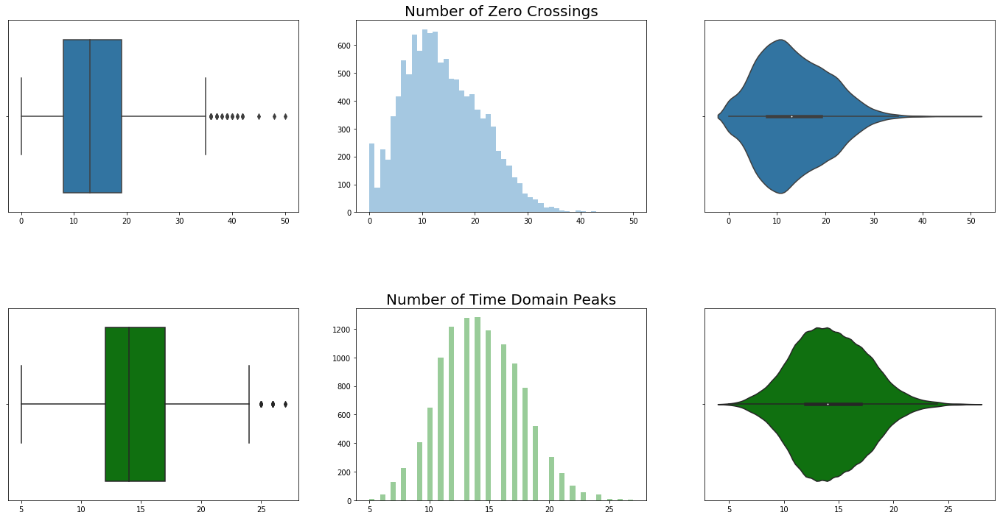

In [36]:
zeros = pd.DataFrame(ML_DF['ZeroXings'])
peaks = pd.DataFrame(ML_DF['TPeaks'])

# Set up matplotlib figure with three subplots
f, axes = plt.subplots(2, 3, figsize=(24, 12))
f.subplots_adjust(hspace=0.5)

# Plot the basic uni-variate figures for Zero Crossings
axes[0,1].set_title("Number of Zero Crossings", fontsize=20)
sns.boxplot(zeros, orient = "h", ax = axes[0,0])
sns.distplot(zeros, kde = False, ax = axes[0,1])
sns.violinplot(zeros, ax = axes[0,2])

# Plot the basic uni-variate figures for Peaks
axes[1,1].set_title("Number of Time Domain Peaks", fontsize=20)
sns.boxplot(peaks, orient = "h", ax = axes[1,0], color = 'g')
sns.distplot(peaks, kde = False, ax = axes[1,1], color = 'g')
sns.violinplot(peaks, ax = axes[1,2], color = 'g')

### Distributions of all statistical variables

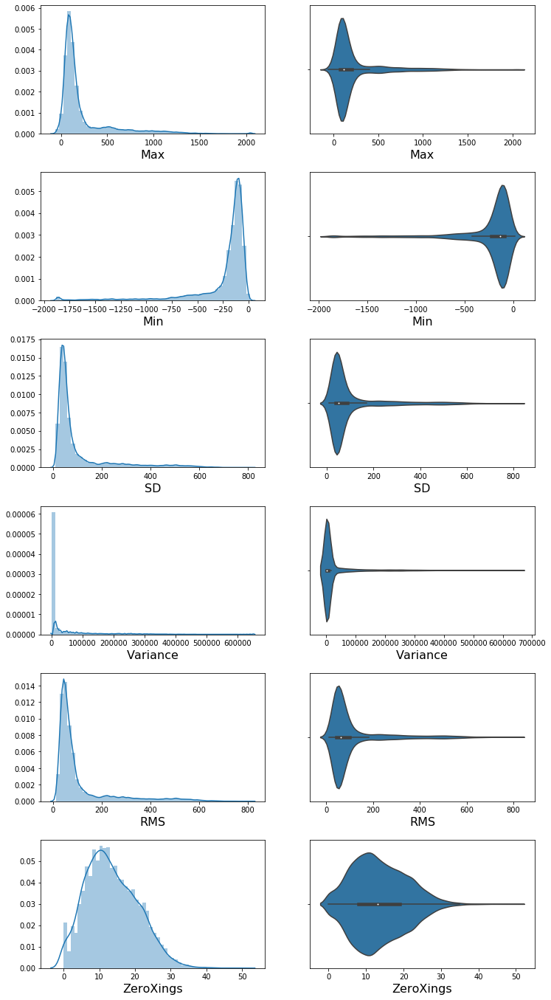

In [37]:
cols = ['Max', 'Min', 'SD', 'Variance', 'RMS', 'ZeroXings']

ML_DF_ALL = pd.DataFrame(ML_DF[cols])

f, axes = plt.subplots(6, 2, figsize=(12, 24))
f.subplots_adjust(hspace=0.3)

count = 0
for var in ML_DF_ALL:
    sns.distplot(ML_DF_ALL[var], ax = axes[count,0])
    sns.violinplot(ML_DF_ALL[var], ax = axes[count,1])
    count += 1

### Box Plots of the wave bands

       RelativeAlpha  RelativeBeta  RelativeTheta  RelativeDelta
count   11500.000000  11500.000000   11500.000000   11500.000000
mean        0.168856      0.186929       0.239527       0.302593
std         0.164633      0.167214       0.185510       0.202568
min         0.000000      0.000000       0.000000       0.000000
25%         0.060000      0.050000       0.100000       0.130000
50%         0.120000      0.140000       0.180000       0.280000
75%         0.220000      0.280000       0.330000       0.450000
max         0.940000      0.960000       0.970000       0.950000


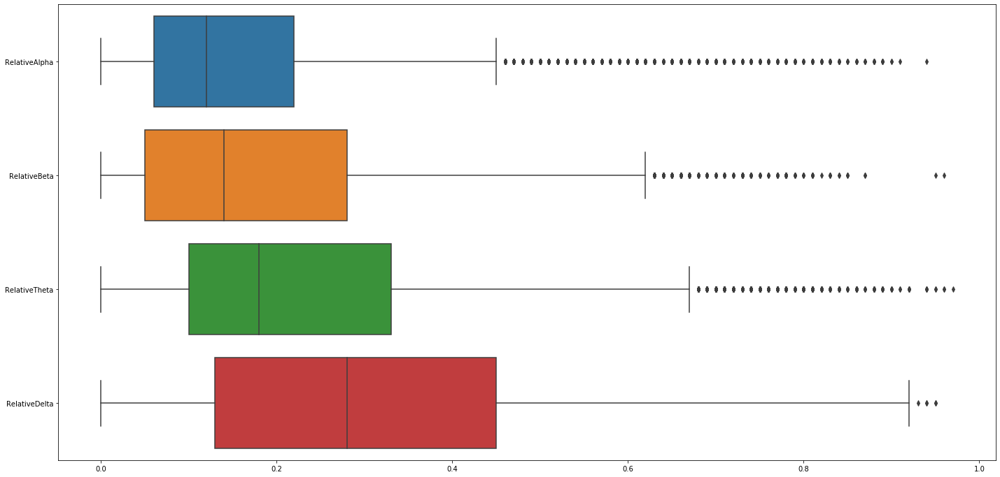

In [38]:
ML_DF_BOX = pd.DataFrame(ML_DF[["RelativeAlpha", "RelativeBeta", "RelativeTheta",
                                "RelativeDelta"]])

print(ML_DF_BOX.describe())

f, axes = plt.subplots(1, 1, figsize=(24, 12))

sns.set_context(rc={"font.size":16,"axes.titlesize":28,"axes.labelsize":16}) 

sns.boxplot(data = ML_DF_BOX, orient = "h")


### KDE Plots

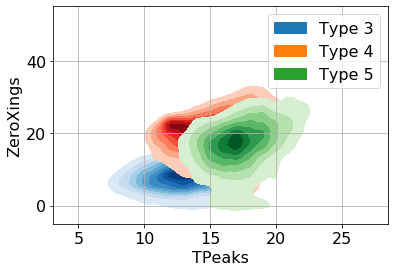

In [39]:
type2_FILTERED = ML_DF[ML_DF['YLabel'] == 2]
type3_FILTERED = ML_DF[ML_DF['YLabel'] == 3]
type4_FILTERED = ML_DF[ML_DF['YLabel'] == 4]
type5_FILTERED = ML_DF[ML_DF['YLabel'] == 5]

# Var1 = 'RelativeAlpha'
# Var2 = 'RelativeDelta'

Var1 = 'TPeaks'
Var2 = 'ZeroXings'

# ax = sns.kdeplot(type2_FILTERED[Var1],
#                  type2_FILTERED[Var2],
#                  cmap="Blues", 
#                  shade=True, shade_lowest=False)

ax = sns.kdeplot(type3_FILTERED[Var1],
                 type3_FILTERED[Var2],
                 cmap="Blues", 
                 shade=True, shade_lowest=False, label="Type 3")

ax = sns.kdeplot(type4_FILTERED[Var1],
                 type4_FILTERED[Var2],
                 cmap="Reds", 
                 shade=True, shade_lowest=False, label="Type 4")

ax = sns.kdeplot(type5_FILTERED[Var1],
                 type5_FILTERED[Var2],
                 cmap="Greens", 
                 shade=True, shade_lowest=False, label="Type 5")

ax.legend()
ax.grid()

### Correlation Plots for all parameters

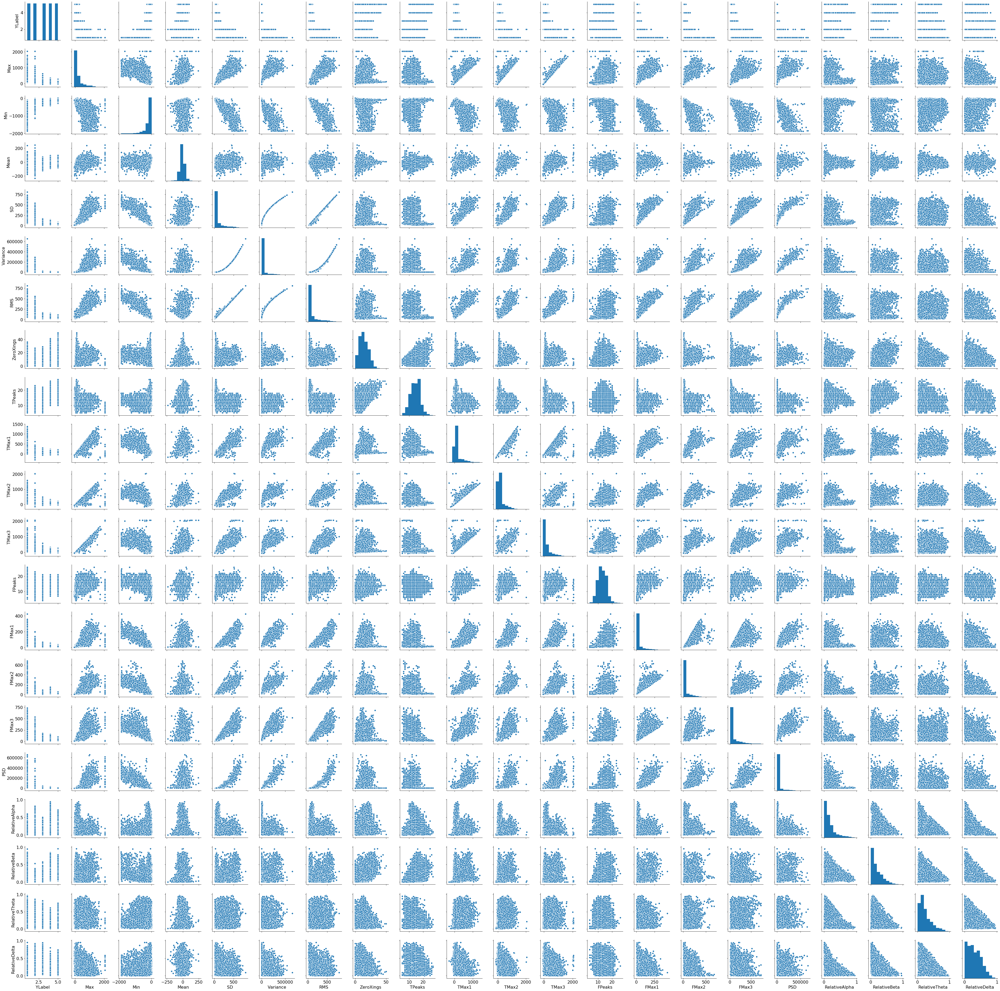

In [40]:
sns.set_context(rc={"font.size":16,"axes.titlesize":28,"axes.labelsize":16}) 

sns.pairplot(data = ML_DF)

### Pairwise Correlation Scatter plot (Statistical)

Text(0.5, 0.98, 'Engineering Statistical Parameters Pairwise Plots')

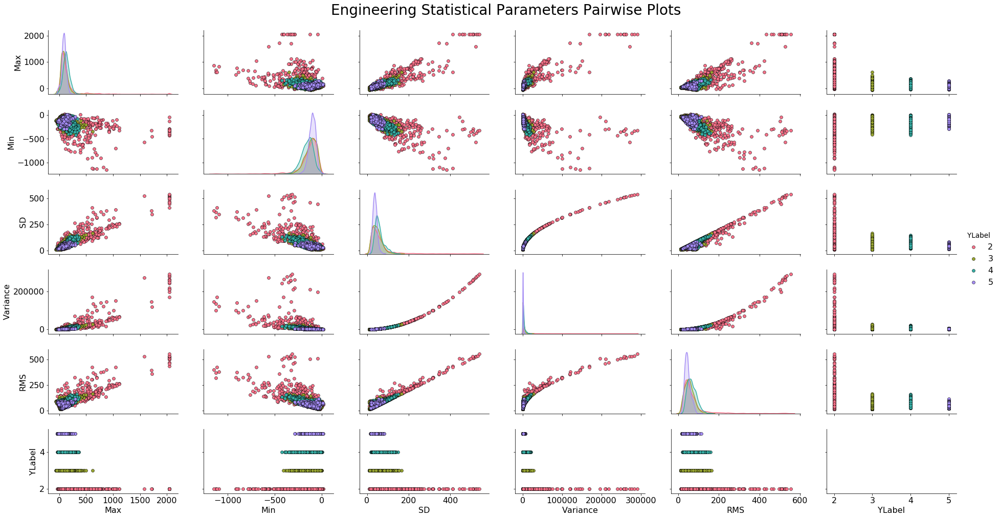

In [41]:
cond = ML_DF['YLabel'] >= 2

ML_DF_MODCORR = ML_DF[cond]

# Attributes to display
# cols = ['Max', 'Min', 'SD', 'Variance', 'RMS', 'PSD', 'RelativeAlpha', 'RelativeBeta', 
#         'RelativeDelta', 'YLabel']

cols = ['Max', 'Min', 'SD', 'Variance', 'RMS', 'YLabel']

sns.set_context(rc={"font.size":16,"axes.titlesize":28,"axes.labelsize":16}) 
        
PPS = sns.pairplot(data=ML_DF_MODCORR[cols], hue='YLabel', size=2.4, aspect=1.8, 
                   palette="husl",  plot_kws=dict(edgecolor="black", linewidth=0.5), kind="scatter" )


fig = PPS.fig 
fig.subplots_adjust(top=0.93, wspace=0.2)
fig.suptitle('Engineering Statistical Parameters Pairwise Plots', fontsize=28)

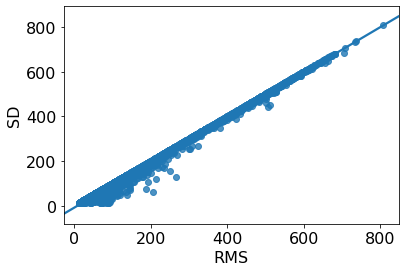

In [42]:
sns.regplot(x="RMS", y="SD", data=ML_DF);

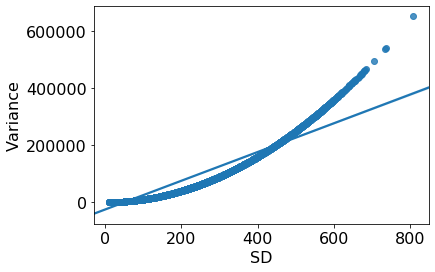

In [43]:
sns.regplot(x="SD", y="Variance", data=ML_DF);

### Pairwise Correlation Scatter plot (PSD)

Text(0.5, 0.98, 'Engineering PSD Parameters Pairwise Plots')

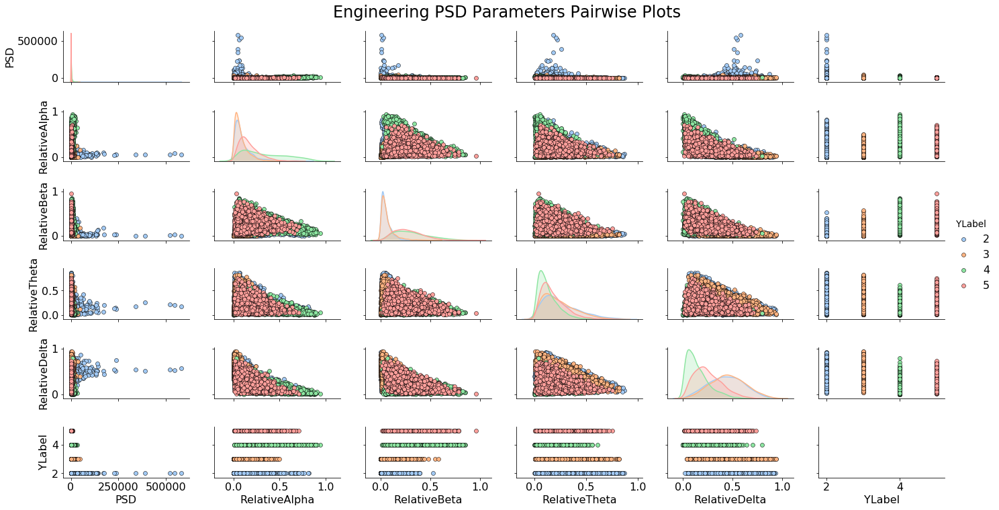

In [44]:
cond = ML_DF['YLabel'] >= 2

ML_DF_MODCORR = ML_DF[cond]

# Attributes to display
cols = ['PSD', 'RelativeAlpha', 'RelativeBeta', 'RelativeTheta',
        'RelativeDelta', 'YLabel']


PPS = sns.pairplot(data=ML_DF_MODCORR[cols], hue='YLabel', size=1.8, aspect=1.8, 
                   palette="pastel",  plot_kws=dict(edgecolor="black", linewidth=0.5) )


fig = PPS.fig 
fig.subplots_adjust(top=0.93, wspace=0.2)
fig.suptitle('Engineering PSD Parameters Pairwise Plots', fontsize=24)

### Using Parallel Coordinates (Statistical)

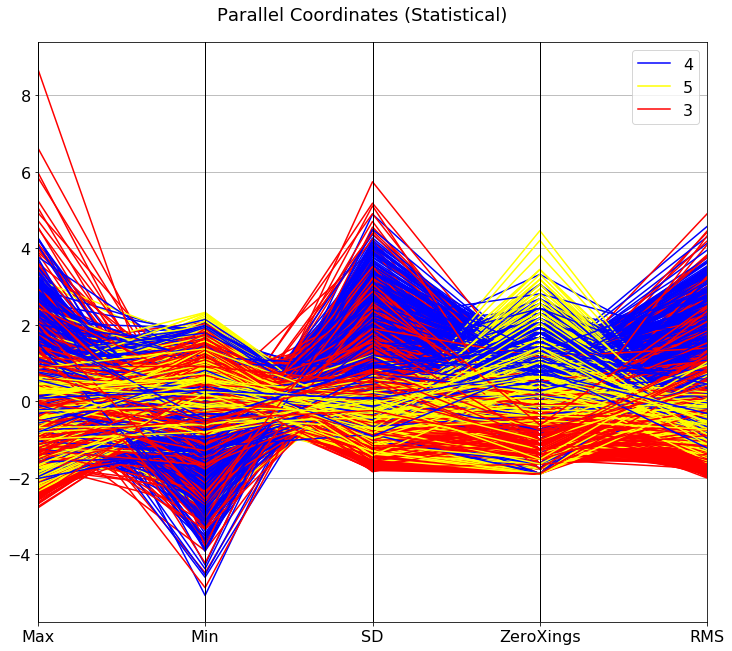

In [45]:
cond = ML_DF['YLabel'] >= 3

ML_DF_MODPP1 = ML_DF[cond]

# To reset the index so that it goes 0,1,2,3,4,5,6,7,8, ......
ML_DF_MODPP1 = ML_DF_MODPP1.reset_index()

# Attributes to display
cols = ['Max', 'Min', 'SD', 'ZeroXings', 'RMS']

ParaDF1 = ML_DF_MODPP1[cols]

# print(ParaDF.head(23))

ss = StandardScaler()
scaled_ParaDF1 = ss.fit_transform(ParaDF1)
scaled_ParaDF1 = pd.DataFrame(scaled_ParaDF1, columns=cols)
final_ParaDF1 = pd.concat([scaled_ParaDF1, ML_DF_MODPP1['YLabel']], axis=1)
final_ParaDF1.head(10)

# Plotting
fig = plt.figure(figsize=(12, 10))
title = fig.suptitle("Parallel Coordinates (Statistical)", fontsize=18)
fig.subplots_adjust(top=0.93, wspace=0)

pc = pd.plotting.parallel_coordinates(final_ParaDF1, 'YLabel', color=('blue', 'yellow', 'red', 'green', 'black'))

### Using Parallel Coordinates (PSD)

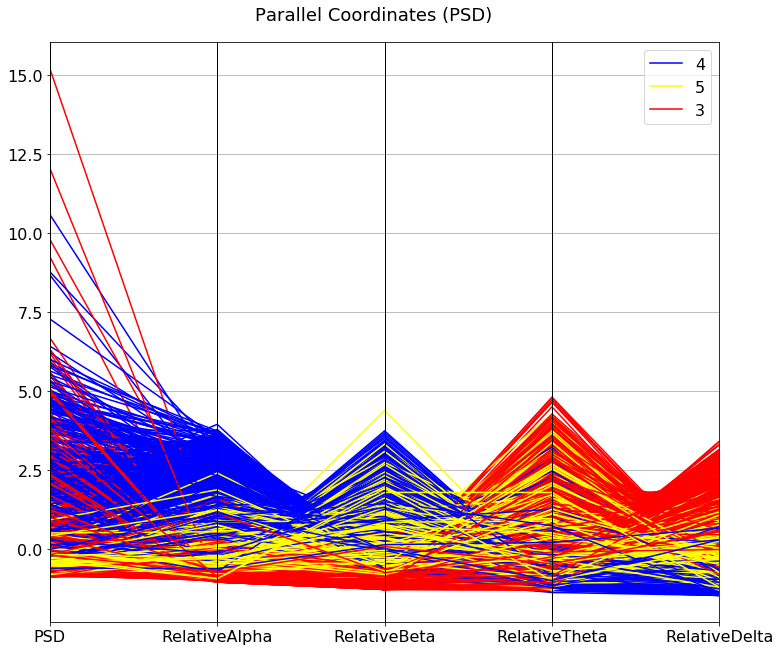

In [46]:
cond = ML_DF['YLabel'] >= 3

ML_DF_MODPP = ML_DF[cond]

# To reset the index so that it goes 0,1,2,3,4,5,6,7,8, ......
ML_DF_MODPP = ML_DF_MODPP.reset_index()

# Attributes to display
cols = ['PSD', 'RelativeAlpha', 'RelativeBeta', 'RelativeTheta', 'RelativeDelta']

ParaDF = ML_DF_MODPP[cols]

ss = StandardScaler()
scaled_ParaDF = ss.fit_transform(ParaDF)
scaled_ParaDF = pd.DataFrame(scaled_ParaDF, columns=cols)
final_ParaDF = pd.concat([scaled_ParaDF, ML_DF_MODPP['YLabel']], axis=1)
final_ParaDF.head(10)

# Plotting
fig = plt.figure(figsize=(12, 10))
title = fig.suptitle("Parallel Coordinates (PSD)", fontsize=18)
fig.subplots_adjust(top=0.93, wspace=0)

pc = pd.plotting.parallel_coordinates(final_ParaDF, 'YLabel', color=('blue', 'yellow', 'red'))

### The following 3D plots require Plotly Express to be installed.
### At the Anaconda prompt type : pip install plotly==4.5.4

### 3D Plot (Statistical)

In [47]:
cond = ML_DF['YLabel'] >= 3

ML_DF_MODSTAT = ML_DF[cond]

fig = px.scatter_3d(ML_DF_MODSTAT, x='ZeroXings', y='Variance', z='RMS',
                  color='YLabel', hover_name='YLabel')

# fig = px.scatter_3d(ML_DF_MODSTAT, x='ZeroXings', y='Variance', z='TPeaks',
#                   color='YLabel', hover_name='YLabel')
fig.show()

### 3D Plot (PSD)

In [48]:
cond = ML_DF['YLabel'] >= 3

ML_DF_MODThree = ML_DF[cond]

fig = px.scatter_3d(ML_DF_MODThree, x='PSD', y='RelativeAlpha', z='RelativeDelta',
                  color='YLabel', hover_name='YLabel')
fig.show()

## Data pre and post processing for features extraction, recognition and classification

### Binary classification where epileptic seizure classified as 1 and the rest set to 0.

In [49]:
binaryML_DF = epilepsyDF.copy(deep = True)

X = binaryML_DF.iloc[:, 0:178].values
# print(X)
# print(X.shape)
# print("")
# print(binaryML_DF)

Y = binaryML_DF.iloc[:, -1].values
# print("Before setting to zero")
# print(len(Y))

# Set the column y values to zero for all types from 2-5
# By setting the values thro the reference variable Y, it will affect the original binaryML_DF
# This script can only be run once. If not please run the script from the top cell again, or run the deep copy again

Y[Y > 1] = 0
# print(binaryML_DF)


X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 2)
SC = StandardScaler()
X_train = SC.fit_transform(X_train)
X_test = SC.transform(X_test)


### According to scikit-learn convention, the confusion matrix is organized as such :
#### the first column contains, negative predictions (TN and FN)
#### the second column contains, positive predictions (TP and FP)
#### the first row contains negative labels (TN and FP)
#### the second row contains positive labels (FN and TP)
#### the diagonal contains the number of correctly predicted labels.

### Random Forest Classifier


Accuracy using K Fold Cross Validation (mean of cross val scores) -  0.9752

Accuracy using Train Test Split -  0.9739

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      1810
           1       0.95      0.93      0.94       490

    accuracy                           0.97      2300
   macro avg       0.97      0.96      0.96      2300
weighted avg       0.97      0.97      0.97      2300


Confusion Matrix
[[1786   24]
 [  36  454]]

True Negatives  :  1786
False Negatives :  36
True Positives  :  454
False Positives :  24

Precision Score -  0.9498
ROC/AUC Score -  0.9566



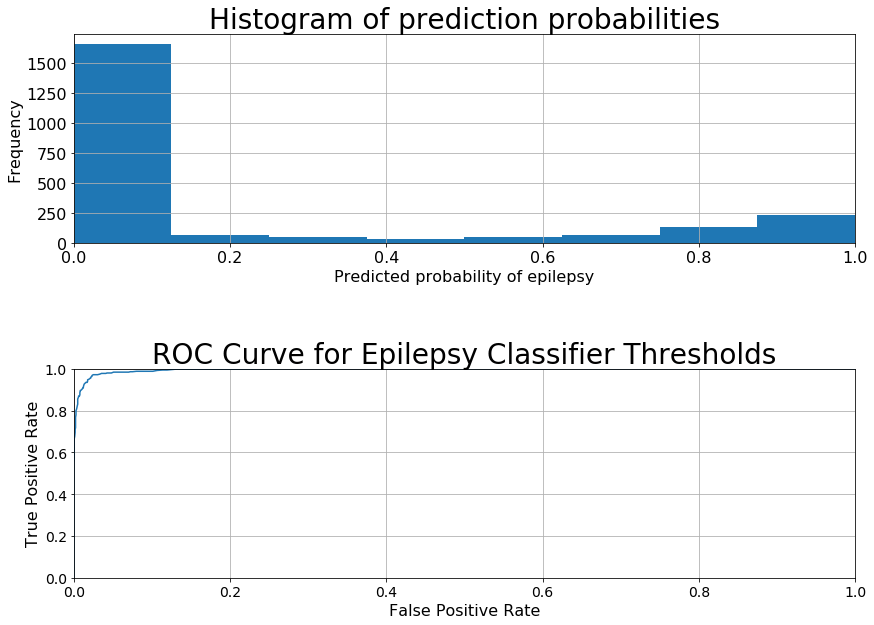

In [50]:
model = RandomForestClassifier(n_estimators=100)
model.fit(X_train, Y_train)
Y_pred_rfc = model.predict(X_test)


# Using K Folds Cross Validation, argument cv is the number of folds
scores = cross_val_score(model, X, Y, cv=5, scoring='accuracy')
print()
print('Accuracy using K Fold Cross Validation (mean of cross val scores) - ', round(scores.mean(), 4))
print()

print("Accuracy using Train Test Split - ", round(metrik.accuracy_score(y_pred = Y_pred_rfc, y_true = Y_test), 4))
print()

print(metrik.classification_report(Y_test, Y_pred_rfc))
print()

print("Confusion Matrix")
print(metrik.confusion_matrix(Y_test, Y_pred_rfc))
print()

acc_rfc = metrik.accuracy_score(Y_test, Y_pred_rfc) * 100

tn, fp, fn, tp = metrik.confusion_matrix(Y_test, Y_pred_rfc).ravel()
print("True Negatives  : ",tn)
print("False Negatives : ",fn)
print("True Positives  : ",tp)
print("False Positives : ",fp)

print()

print('Precision Score - ', round(metrik.precision_score(Y_test, Y_pred_rfc), 4))

print('ROC/AUC Score - ', round(metrik.roc_auc_score(Y_test, Y_pred_rfc), 4))
print()


y_pred_proba = model.predict_proba(X_test)[:, 1]

fig = plt.figure(figsize=(14, 10))
fig.subplots_adjust(hspace=0.6)

plt.subplot(211)
plt.rcParams['font.size'] = 14
plt.hist(y_pred_proba, bins=8)
plt.xlim(0, 1)
plt.title('Histogram of prediction probabilities')
plt.xlabel('Predicted probability of epilepsy')
plt.ylabel('Frequency')
plt.grid(True)


fpr, tpr, thresholds = metrik.roc_curve(Y_test, y_pred_proba)
# print(fpr)
# print(tpr)

plt.subplot(212)
plt.plot(fpr, tpr)
plt.xlim(0.0, 1.0)
plt.ylim(0.0, 1.0)
plt.title('ROC Curve for Epilepsy Classifier Thresholds')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)
plt.show()


### Support Vector Machine (SVM)

In [51]:
model = SVC()
model.fit(X_train, Y_train)
Y_pred_svc = model.predict(X_test)

acc_svc = round(model.score(X_test, Y_test) * 100, 2)
print (str(acc_svc) + '%')
print()

print("Accuracy - ", round(metrik.accuracy_score(y_pred = Y_pred_svc, y_true = Y_test), 4))
print()
print("Confusion Matrix")
print(metrik.confusion_matrix(Y_test, Y_pred_svc))
print()

tn, fp, fn, tp = metrik.confusion_matrix(Y_test, Y_pred_svc).ravel()
print("True Negatives  : ",tn)
print("False Negatives : ",fn)
print("True Positives  : ",tp)
print("False Positives : ",fp)


97.17%

Accuracy -  0.9717

Confusion Matrix
[[1796   14]
 [  51  439]]

True Negatives  :  1796
False Negatives :  51
True Positives  :  439
False Positives :  14


### Logistic Regression

In [52]:
model = LogisticRegression(solver='lbfgs')
model.fit(X_train, Y_train)
Y_pred_log_reg = model.predict(X_test)

acc_log_reg = round(model.score(X_test, Y_test) * 100, 2)
print (str(acc_log_reg) + ' %')
print()

print("Accuracy - ", round(metrik.accuracy_score(y_pred = Y_pred_log_reg, y_true = Y_test), 4))
print()
print("Confusion Matrix")
print(metrik.confusion_matrix(Y_test, Y_pred_log_reg))
print()

tn, fp, fn, tp = metrik.confusion_matrix(Y_test, Y_pred_log_reg).ravel()
print("True Negatives  : ",tn)
print("False Negatives : ",fn)
print("True Positives  : ",tp)
print("False Positives : ",fp)

80.78 %

Accuracy -  0.8078

Confusion Matrix
[[1809    1]
 [ 441   49]]

True Negatives  :  1809
False Negatives :  441
True Positives  :  49
False Positives :  1


### K Nearest Neighbours

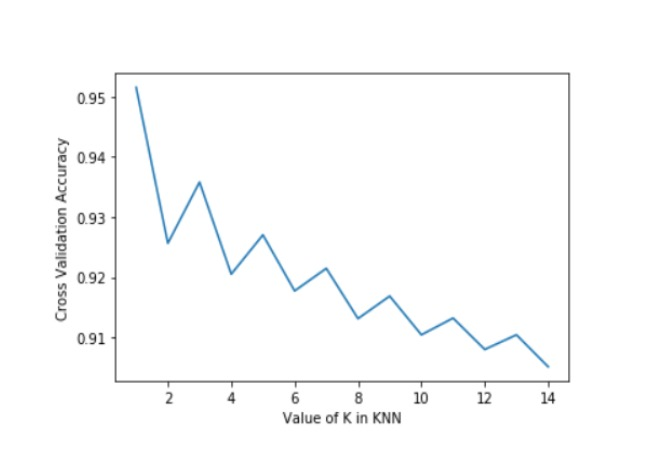

In [53]:
# This code segment takes a long time to run. Anyway the results of such a run has been
# captured in the image file.

# KNeighbors_range = range(1, 15)
# KNN_scores = []

# for k in KNeighbors_range :
#     knn = KNeighborsClassifier(n_neighbors = k)
#     scores = cross_val_score(knn, X, Y, cv=10, scoring='accuracy')
#     KNN_scores.append(scores.mean())
    
# plt.plot(KNeighbors_range, KNN_scores)
# plt.xlabel('Value of K in KNN')
# plt.ylabel('Cross Validation Accuracy')

from IPython.display import Image
Image(filename='KNNChart.png')


In [54]:
model = KNeighborsClassifier(n_neighbors = 1)
model.fit(X_train, Y_train)
Y_pred_knn = model.predict(X_test)

acc_knn = round(model.score(X_test, Y_test) * 100, 2)
print (str(acc_knn) +'%')
print()

print("Accuracy - ", round(metrik.accuracy_score(y_pred = Y_pred_knn, y_true = Y_test), 4))
print()
print("Confusion Matrix")
print(metrik.confusion_matrix(Y_test, Y_pred_knn))
print()

tn, fp, fn, tp = metrik.confusion_matrix(Y_test, Y_pred_knn).ravel()
print("True Negatives  : ",tn)
print("False Negatives : ",fn)
print("True Positives  : ",tp)
print("False Positives : ",fp)

94.61%

Accuracy -  0.9461

Confusion Matrix
[[1809    1]
 [ 123  367]]

True Negatives  :  1809
False Negatives :  123
True Positives  :  367
False Positives :  1


### Naive Bayes

In [55]:
model = GaussianNB()
model.fit(X_train, Y_train)
Y_pred_gnb = model.predict(X_test)

acc_gnb = round(model.score(X_test, Y_test) * 100, 2)
print (str(acc_gnb) + '%')
print()

print("Accuracy - ", round(metrik.accuracy_score(y_pred = Y_pred_gnb, y_true = Y_test), 4))
print()
print("Confusion Matrix")
print(metrik.confusion_matrix(Y_test, Y_pred_gnb))
print()

tn, fp, fn, tp = metrik.confusion_matrix(Y_test, Y_pred_gnb).ravel()
print("True Negatives  : ",tn)
print("False Negatives : ",fn)
print("True Positives  : ",tp)
print("False Positives : ",fp)

95.91%

Accuracy -  0.9591

Confusion Matrix
[[1771   39]
 [  55  435]]

True Negatives  :  1771
False Negatives :  55
True Positives  :  435
False Positives :  39


### Principal Component Analysis (PCA)

In [56]:
pca = PCA()
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

acc_PCA = round(pca.score(X_test, Y_test))
print (str(acc_PCA) + '%')

71.0%


### Summary for Type 1 versus the Rest

In [57]:
print("Type 1 versus the rest set at 0")

models = pd.DataFrame({
    'Model': ['Random Forest', 'Logistic Regression', 'Support Vector Machines', 
              'KNN', 'Naive Bayes', 'Principal Component Analysis'],
    
    'Score': [acc_rfc, acc_log_reg, acc_svc, acc_knn, acc_gnb, acc_PCA ]   })

models.sort_values(by='Score', ascending=False)

Type 1 versus the rest set at 0


,Model,Score
0,Random Forest,97.391304
2,Support Vector Machines,97.170000
4,Naive Bayes,95.910000
3,KNN,94.610000
1,Logistic Regression,80.780000
5,Principal Component Analysis,71.000000


### We shall use Random Forest as our desired classification algorithm when classifying Type 1 from the rest. Next we proceed to classify Type 2 and the rest.

***

### --------------------------------------------------------------------------------------------------------------------------------------------------

## Binary Classification for Type 2 versus the rest

In [58]:
binaryML_DF = epilepsyDF.copy(deep = True)

condition = binaryML_DF['y'] >= 2

binaryML_DF_FILTERED = binaryML_DF[condition]

# print(binaryML_DF_FILTERED)

X = binaryML_DF_FILTERED.iloc[:, 0:178].values
# print(X)
# print(X.shape)
# print()

Y = binaryML_DF_FILTERED.iloc[:, -1].values
# print("Before setting to zero")
# print(Y)

# Set the labels to 0 and 1 because ROC/AUC and Precision scores require class labels to be binary 0 and 1
Y[Y > 2] = 0
Y[Y == 2] = 1

# print(binaryML_DF_FILTERED.head(12))
# print(binaryML_DF.head(12))

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 0)
SC = StandardScaler()
X_train = SC.fit_transform(X_train)
X_test = SC.transform(X_test)

### Random Forest


Random Forest Accuracy using K Fold Cross Validation (mean of cross val scores) -  0.7915

Random Forest Accuracy using Train Test Split -  0.7951

              precision    recall  f1-score   support

           0       0.79      0.99      0.88      1371
           1       0.87      0.23      0.36       469

    accuracy                           0.80      1840
   macro avg       0.83      0.61      0.62      1840
weighted avg       0.81      0.80      0.75      1840


Confusion Matrix for Random Forest
[[1355   16]
 [ 361  108]]

True Negatives  :  1355
False Negatives :  361
True Positives  :  108
False Positives :  16

Precision Score -  0.871
ROC/AUC Score -  0.6093



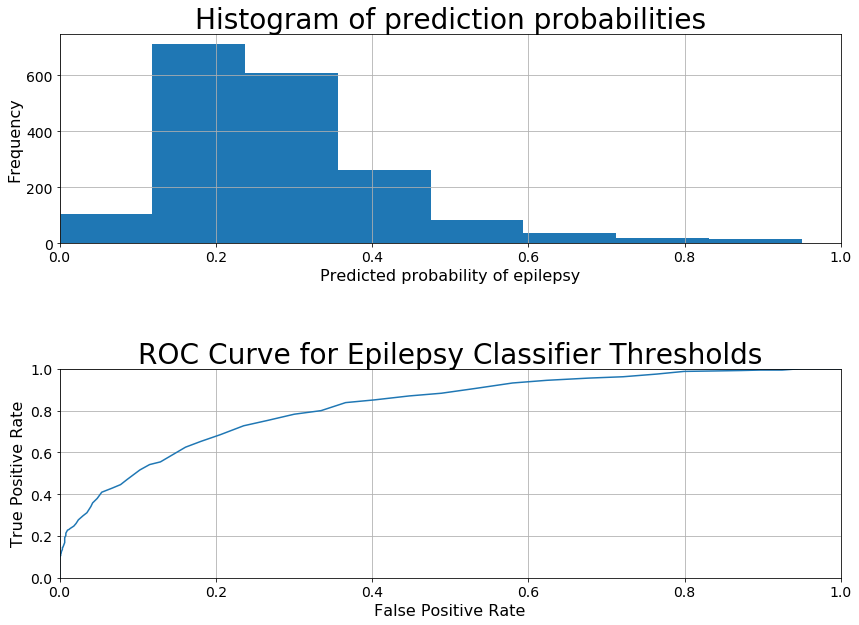

In [59]:
model = RandomForestClassifier(n_estimators=100)
model.fit(X_train, Y_train)
Y_pred_rfc = model.predict(X_test)


# Using K Folds Cross Validation, argument cv is the number of folds
scores = cross_val_score(model, X, Y, cv=5, scoring='accuracy')
print()
print('Random Forest Accuracy using K Fold Cross Validation (mean of cross val scores) - ', round(scores.mean(), 4))
print()

print("Random Forest Accuracy using Train Test Split - ", round(metrik.accuracy_score(y_pred = Y_pred_rfc, y_true = Y_test), 4))
print()

print(metrik.classification_report(Y_test, Y_pred_rfc))
print()

print("Confusion Matrix for Random Forest")
print(metrik.confusion_matrix(Y_test, Y_pred_rfc))
print()

tn, fp, fn, tp = metrik.confusion_matrix(Y_test, Y_pred_rfc).ravel()
print("True Negatives  : ",tn)
print("False Negatives : ",fn)
print("True Positives  : ",tp)
print("False Positives : ",fp)
print()

acc_rfc2 = metrik.accuracy_score(y_pred = Y_pred_rfc, y_true = Y_test) * 100

print('Precision Score - ', round(metrik.precision_score(Y_test, Y_pred_rfc), 4))

print('ROC/AUC Score - ', round(metrik.roc_auc_score(Y_test, Y_pred_rfc), 4))
print()


y_pred_proba = model.predict_proba(X_test)[:, 1]

fig = plt.figure(figsize=(14, 10))
fig.subplots_adjust(hspace=0.6)

plt.subplot(211)
plt.rcParams['font.size'] = 14
plt.hist(y_pred_proba, bins=8)
plt.xlim(0, 1)
plt.title('Histogram of prediction probabilities')
plt.xlabel('Predicted probability of epilepsy')
plt.ylabel('Frequency')
plt.grid(True)


fpr, tpr, thresholds = metrik.roc_curve(Y_test, y_pred_proba)
# print(fpr)
# print(tpr)

plt.subplot(212)
plt.plot(fpr, tpr)
plt.xlim(0.0, 1.0)
plt.ylim(0.0, 1.0)
plt.title('ROC Curve for Epilepsy Classifier Thresholds')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)
plt.show()


### Support Vector Machine

In [60]:
model = SVC()
model.fit(X_train, Y_train)
Y_pred_svc = model.predict(X_test)

acc_svc2 = round(model.score(X_test, Y_test) * 100, 2)
print (str(acc_svc2) + '%')
print()

print("SVM Accuracy - ", round(metrik.accuracy_score(Y_test, Y_pred_svc), 4))
print()
print("Confusion Matrix for SVM")
print(metrik.confusion_matrix(Y_test, Y_pred_svc))
print()

tn, fp, fn, tp = metrik.confusion_matrix(Y_test, Y_pred_svc).ravel()
print("True Negatives  : ",tn)
print("False Negatives : ",fn)
print("True Positives  : ",tp)
print("False Positives : ",fp)

79.57%

SVM Accuracy -  0.7957

Confusion Matrix for SVM
[[1365    6]
 [ 370   99]]

True Negatives  :  1365
False Negatives :  370
True Positives  :  99
False Positives :  6


### Logistic Regression

In [61]:
model = LogisticRegression(solver='lbfgs')
model.fit(X_train, Y_train)
Y_pred_log_reg = model.predict(X_test)

acc_log_reg2 = round(model.score(X_test, Y_test) * 100, 2)
print (str(acc_log_reg2) + ' %')
print()

print("Logistics Regression Accuracy - ", round(metrik.accuracy_score(y_pred = Y_pred_log_reg, y_true = Y_test), 4))
print()
print("Confusion Matrix - Logistics Regression")
print(metrik.confusion_matrix(Y_test, Y_pred_log_reg))
print()

tn, fp, fn, tp = metrik.confusion_matrix(Y_test, Y_pred_log_reg).ravel()
print("True Negatives  : ",tn)
print("False Negatives : ",fn)
print("True Positives  : ",tp)
print("False Positives : ",fp)

74.24 %

Logistics Regression Accuracy -  0.7424

Confusion Matrix - Logistics Regression
[[1358   13]
 [ 461    8]]

True Negatives  :  1358
False Negatives :  461
True Positives  :  8
False Positives :  13


### K Nearest Neighbor (KNN)

In [62]:
model = KNeighborsClassifier(n_neighbors = 12)
model.fit(X_train, Y_train)
Y_pred_knn = model.predict(X_test)

acc_knn2 = round(model.score(X_test, Y_test) * 100, 2)
print (str(acc_knn2) +'%')
print()

print("KNN Accuracy - ", round(metrik.accuracy_score(Y_test, Y_pred_knn), 4))
print()
print("Confusion Matrix for KNN")
print(metrik.confusion_matrix(Y_test, Y_pred_knn))
print()

tn, fp, fn, tp = metrik.confusion_matrix(Y_test, Y_pred_knn).ravel()
print("True Negatives  : ",tn)
print("False Negatives : ",fn)
print("True Positives  : ",tp)
print("False Positives : ",fp)

75.6%

KNN Accuracy -  0.756

Confusion Matrix for KNN
[[1198  173]
 [ 276  193]]

True Negatives  :  1198
False Negatives :  276
True Positives  :  193
False Positives :  173


### Naive Bayes

In [63]:
model = GaussianNB()
model.fit(X_train, Y_train)
Y_pred_gnb = model.predict(X_test)

acc_gnb2 = round(model.score(X_test, Y_test) * 100, 2)
print (str(acc_gnb2) + '%')
print()

print("Naive Bayes Accuracy - ", round(metrik.accuracy_score(y_pred = Y_pred_gnb, y_true = Y_test), 4))
print()
print("Confusion Matrix for Naive Bayes")
print(metrik.confusion_matrix(y_pred = Y_pred_gnb, y_true = Y_test))
print()

tn, fp, fn, tp = metrik.confusion_matrix(Y_test, Y_pred_gnb).ravel()
print("True Negatives  : ",tn)
print("False Negatives : ",fn)
print("True Positives  : ",tp)
print("False Positives : ",fp)

66.79%

Naive Bayes Accuracy -  0.6679

Confusion Matrix for Naive Bayes
[[1088  283]
 [ 328  141]]

True Negatives  :  1088
False Negatives :  328
True Positives  :  141
False Positives :  283


### Summary for Type 2 versus the Rest

In [92]:
models = pd.DataFrame({
    'Model': ['Random Forest', 'Logistic Regression', 'Support Vector Machines', 
              'KNN', 'Naive Bayes'],
    
    'Score': [acc_rfc2, acc_log_reg2, acc_svc2, acc_knn2, acc_gnb2]   })

models.sort_values(by='Score', ascending=False)

,Model,Score
2,Support Vector Machines,79.57000
0,Random Forest,79.51087
3,KNN,75.60000
1,Logistic Regression,74.24000
4,Naive Bayes,66.79000


## --------------------------------------------------------------------------------------------------------------------------

## Multi Class classification for types 3,4,5

***

In [93]:
ML_DF = pd.read_csv('My_ML_DF.csv', index_col=0)

# Select the relevant types
cond = ML_DF['YLabel'] >= 3

ML_DF_MOD = ML_DF[cond]

# print(ML_DF_MOD.head(23))


# Select specific columns. Different Configurations to choose from

# X = ML_DF_MOD[['Max', 'Min', 'Mean', 'RMS', 'PSD', 'RelativeAlpha', 'RelativeBeta', 'RelativeTheta', 'RelativeDelta']]
# X = ML_DF_MOD[[PSD', 'RelativeAlpha', 'RelativeBeta', 'RelativeTheta', 'RelativeDelta']]
# X = ML_DF_MOD[['PSD', 'RelativeBeta', 'RelativeDelta']]
X = ML_DF_MOD[['Max', 'Min', 'ZeroXings', 'RMS', 'TMax1', 'TMax2', 'PSD', 'RelativeAlpha', 'RelativeBeta', 'RelativeTheta', 'RelativeDelta']]


Y = ML_DF_MOD.iloc[:, 0].values
# print(len(Y))
# print(Y)


X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 2)
SC = StandardScaler()
X_train = SC.fit_transform(X_train)
X_test = SC.transform(X_test)

### One versus the rest Multiclass Classifier

In [94]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.neural_network import MLPClassifier

dnns_classifier = OneVsRestClassifier(MLPClassifier( hidden_layer_sizes = [100]*5))
dnns_classifier.fit(X_train, Y_train)
dnns_predictions_labels = dnns_classifier.predict(X_test)

acc_ivr = round(dnns_classifier.score(X_test, Y_test) * 100, 2)
print ('One versus R Classifier accuracy - ', str(acc_ivr) + '%')

One versus R Classifier accuracy -  81.74%


### Random Forest


Random Forest Accuracy using K Fold Cross Validation (mean of above scores) -  0.8207

Random Forest Accuracy using Train Test Split -  0.8348

              precision    recall  f1-score   support

           3       0.92      0.89      0.91       474
           4       0.80      0.83      0.82       444
           5       0.78      0.78      0.78       462

    accuracy                           0.83      1380
   macro avg       0.83      0.83      0.83      1380
weighted avg       0.84      0.83      0.84      1380


Confusion Matrix for Random Forest
[[423  21  30]
 [  5 368  71]
 [ 32  69 361]]

Precision Score -  [0.91956522 0.80349345 0.78138528]


(4.0, 0.0)

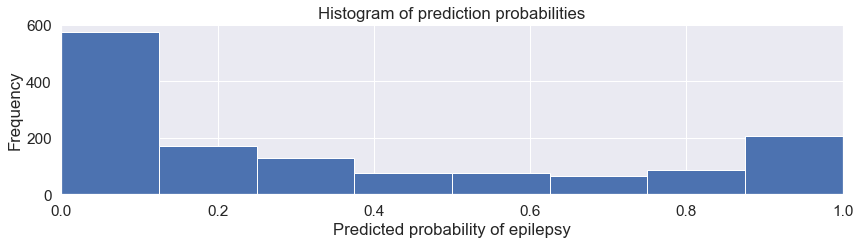

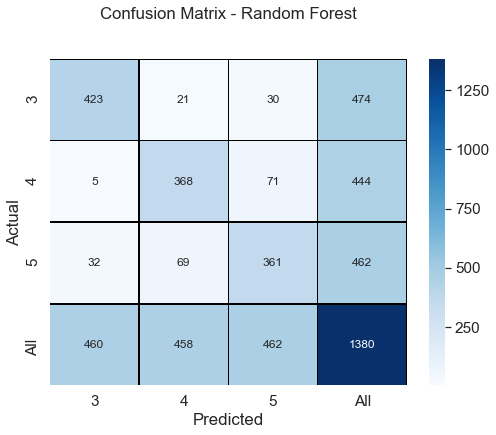

In [95]:
model = RandomForestClassifier(n_estimators=100)
model.fit(X_train, Y_train)
Y_pred_rfc = model.predict(X_test)


# Using K Folds Cross Validation, argument cv is the number of folds
scores = cross_val_score(model, X, Y, cv=10, scoring='accuracy')
print()
print('Random Forest Accuracy using K Fold Cross Validation (mean of above scores) - ', round(scores.mean(), 4))
print()

print("Random Forest Accuracy using Train Test Split - ", round(metrik.accuracy_score(y_pred = Y_pred_rfc, y_true = Y_test), 4))
print()

print(metrik.classification_report(Y_test, Y_pred_rfc))
print()

print("Confusion Matrix for Random Forest")
print(metrik.confusion_matrix(Y_test, Y_pred_rfc))
print()

acc_rfcM = round(metrik.accuracy_score(y_pred = Y_pred_rfc, y_true = Y_test) * 100, 2)

# Use average=None because this is multi class and NOT binary
print("Precision Score - ", metrik.precision_score(Y_test, Y_pred_rfc, average=None))


y_pred_proba = model.predict_proba(X_test)[:, 1]

fig = plt.figure(figsize=(14, 10))
fig.subplots_adjust(hspace=1.2)

plt.subplot(211)
plt.rcParams['font.size'] = 14
plt.hist(y_pred_proba, bins=8)
plt.xlim(0, 1)
plt.title('Histogram of prediction probabilities')
plt.xlabel('Predicted probability of epilepsy')
plt.ylabel('Frequency')
plt.grid(True)


fig, ax = plt.subplots(figsize=(8, 6))  
sns.set(font_scale=1.4) # for label size
ax.set_title("Confusion Matrix - Random Forest", pad=40)
confusion_matrix = pd.crosstab(Y_test, Y_pred_rfc, rownames=['Actual'], colnames=['Predicted'], margins = True)

hm = sns.heatmap(confusion_matrix, annot=True, annot_kws={"size": 12}, cmap='Blues', linecolor='black', linewidths=.5, fmt='d')
b,t = hm.get_ylim()
b = b + 0.5
t = t - 0.5
hm.set_ylim(b,t)

### K Fold Cross Validation to find the optimal K in KNN
#### Takes 5-10 mins to run

Text(0, 0.5, 'Cross Validation Accuracy')

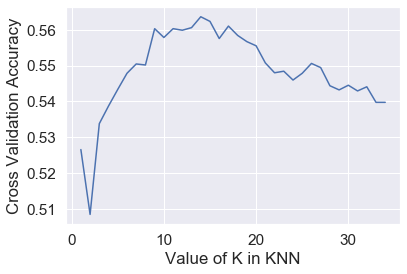

In [96]:
KNeighbors_range = range(1, 35)
KNN_scores = []

for k in KNeighbors_range :
    knn = KNeighborsClassifier(n_neighbors = k)
    scores = cross_val_score(knn, X, Y, cv=10, scoring='accuracy')
    KNN_scores.append(scores.mean())
    
plt.plot(KNeighbors_range, KNN_scores)
plt.xlabel('Value of K in KNN')
plt.ylabel('Cross Validation Accuracy')

### K Nearest Neighbors (KNN)

84.2%

KNN Accuracy -  0.8420289855072464

Confusion Matrix for KNN
[[430  16  28]
 [  7 359  78]
 [ 33  56 373]]


(4.0, 0.0)

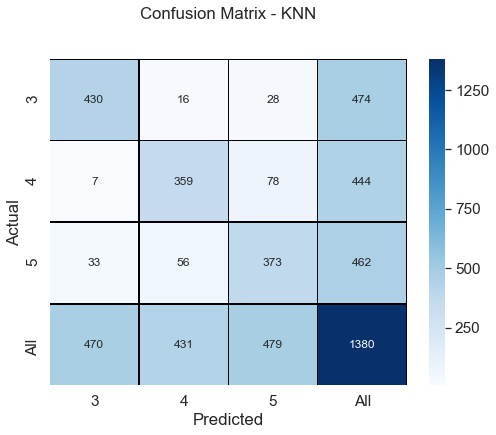

In [97]:
model = KNeighborsClassifier(n_neighbors = 13)
model.fit(X_train, Y_train)
Y_pred_knn = model.predict(X_test)

acc_knnM = round(model.score(X_test, Y_test) * 100, 2)
print (str(acc_knnM) +'%')
print()

print("KNN Accuracy - ", metrik.accuracy_score(y_pred = Y_pred_knn, y_true = Y_test))
print()
print("Confusion Matrix for KNN")
print(metrik.confusion_matrix(Y_test, Y_pred_knn))


fig, ax = plt.subplots(figsize=(8, 6))  
sns.set(font_scale=1.4) # for label size
ax.set_title("Confusion Matrix - KNN", pad=40)
ax.set_xlabel('')
confusion_matrix = pd.crosstab(Y_test, Y_pred_knn, rownames=['Actual'], colnames=['Predicted'], margins = True)

hm = sns.heatmap(confusion_matrix, annot=True, annot_kws={"size": 12}, cmap='Blues', linecolor='black', linewidths=.5, fmt='d')
b,t = hm.get_ylim()
b = b + 0.5
t = t - 0.5
hm.set_ylim(b,t)

### Support Vector Machine (SVM)

84.93%

SVM Accuracy -  0.8493

Confusion Matrix for SVM
[[430  18  26]
 [  6 366  72]
 [ 27  59 376]]


(4.0, 0.0)

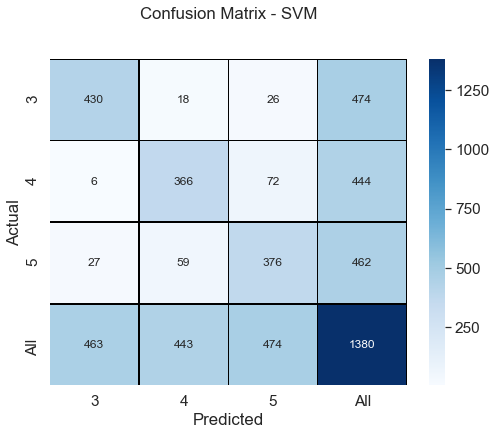

In [98]:
model = SVC()
model.fit(X_train, Y_train)
Y_pred_svc = model.predict(X_test)

acc_svcM = round(model.score(X_test, Y_test) * 100, 2)
print (str(acc_svcM) + '%')
print()

print("SVM Accuracy - ", round(metrik.accuracy_score(y_pred = Y_pred_svc, y_true = Y_test), 4))
print()
print("Confusion Matrix for SVM")
print(metrik.confusion_matrix(Y_test, Y_pred_svc))

fig, ax = plt.subplots(figsize=(8, 6))  
sns.set(font_scale=1.4) # for label size
ax.set_title("Confusion Matrix - SVM", pad=40)
confusion_matrix = pd.crosstab(Y_test, Y_pred_svc, rownames=['Actual'], colnames=['Predicted'], margins = True)

hm = sns.heatmap(confusion_matrix, annot=True, annot_kws={"size": 12}, cmap='Blues', linecolor='black', linewidths=.5, fmt='d')
b,t = hm.get_ylim()
b = b + 0.5
t = t - 0.5
hm.set_ylim(b,t)

### Naive Bayes

79.57%

Naive Bayes Accuracy -  0.7957

Confusion Matrix for Naive Bayes
[[396  28  50]
 [  6 329 109]
 [ 48  41 373]]


(4.0, 0.0)

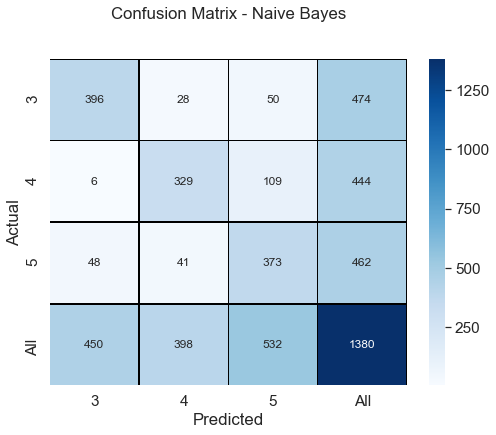

In [99]:
model = GaussianNB()
model.fit(X_train, Y_train)
Y_pred_gnb = model.predict(X_test)

acc_gnbM = round(model.score(X_test, Y_test) * 100, 2)
print (str(acc_gnbM) + '%')
print()

print("Naive Bayes Accuracy - ", round(metrik.accuracy_score(y_pred = Y_pred_gnb, y_true = Y_test), 4))
print()
print("Confusion Matrix for Naive Bayes")
print(metrik.confusion_matrix(Y_test, Y_pred_gnb))

fig, ax = plt.subplots(figsize=(8, 6))  
sns.set(font_scale=1.4) # for label size
ax.set_title("Confusion Matrix - Naive Bayes", pad=40)
confusion_matrix = pd.crosstab(Y_test, Y_pred_gnb, rownames=['Actual'], colnames=['Predicted'], margins = True)

hm = sns.heatmap(confusion_matrix, annot=True, annot_kws={"size": 12}, cmap='Blues', linecolor='black', linewidths=.5, fmt='d')
b,t = hm.get_ylim()
b = b + 0.5
t = t - 0.5
hm.set_ylim(b,t)

### Logistic Regression

78.91 %

Logistics Regression Accuracy -  0.7891

Confusion Matrix for Logistics Regression
[[421  26  27]
 [ 10 362  72]
 [ 79  77 306]]


(4.0, 0.0)

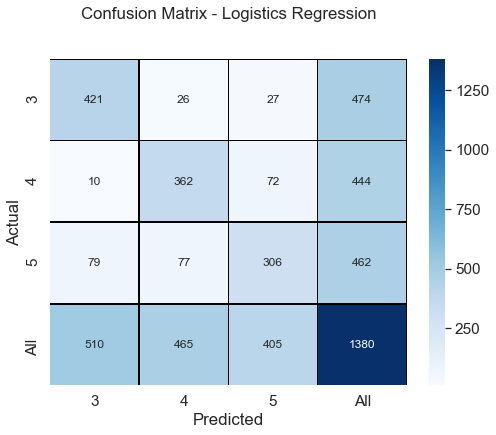

In [100]:
model = LogisticRegression(solver='lbfgs')
model.fit(X_train, Y_train)
Y_pred_log_reg = model.predict(X_test)

acc_log_regM = round(model.score(X_test, Y_test) * 100, 2)
print (str(acc_log_regM) + ' %')
print()

print("Logistics Regression Accuracy - ", round(metrik.accuracy_score(y_pred = Y_pred_log_reg, y_true = Y_test), 4))
print()
print("Confusion Matrix for Logistics Regression")
print(metrik.confusion_matrix(Y_test, Y_pred_log_reg))

fig, ax = plt.subplots(figsize=(8, 6))  
sns.set(font_scale=1.4) # for label size
ax.set_title("Confusion Matrix - Logistics Regression", pad=40)
confusion_matrix = pd.crosstab(Y_test, Y_pred_log_reg, rownames=['Actual'], colnames=['Predicted'], margins = True)

hm = sns.heatmap(confusion_matrix, annot=True, annot_kws={"size": 12}, cmap='Blues', linecolor='black', linewidths=.5, fmt='d')
b,t = hm.get_ylim()
b = b + 0.5
t = t - 0.5
hm.set_ylim(b,t)

### Summary for Multi Class Classification for types 3-5

In [101]:
models = pd.DataFrame({
    'Model': ['Random Forest', 'Logistic Regression', 'Support Vector Machines', 
              'KNN', 'Naive Bayes'],
    
    'Score': [acc_rfcM, acc_log_regM, acc_svcM, acc_knnM, acc_gnbM]   })

models.sort_values(by='Score', ascending=False)

,Model,Score
2,Support Vector Machines,84.93
3,KNN,84.20
0,Random Forest,83.48
4,Naive Bayes,79.57
1,Logistic Regression,78.91


### Further investigation for Multi Class Classification type 3-5

In [102]:
startdata = pd.read_csv('My_ML_DF.csv',index_col=0)

# Extract Response and Predictors
cuttdata = startdata[startdata.YLabel != 1]
cutdata = cuttdata[cuttdata.YLabel != 2]
cutdata

,YLabel,Max,Min,Mean,SD,Variance,RMS,ZeroXings,TPeaks,TMax1,TMax2,TMax3,FPeaks,FMax1,FMax2,FMax3,PSD,RelativeAlpha,RelativeBeta,RelativeTheta,RelativeDelta
0,4,229,-281,-16.910112,95.710958,9160.587426,97.193309,23,16,116.935729,141.800505,209.508066,14,24.413606,51.393701,73.570488,11593.06,0.09,0.64,0.01,0.23
2,5,80,-126,-44.044944,44.186380,1952.436182,62.389048,12,14,33.138037,66.837001,53.441265,15,18.284170,20.965125,26.965628,1504.05,0.20,0.33,0.22,0.19
3,5,-22,-105,-68.910112,15.923723,253.564954,70.726010,0,20,-34.437840,-31.303964,-31.905172,10,5.917627,7.075047,7.967487,253.09,0.19,0.36,0.14,0.28
4,5,78,-103,-6.651685,38.693001,1497.148340,39.260581,27,21,51.782890,52.555646,64.155186,15,12.326108,12.798366,29.140551,1004.99,0.11,0.35,0.13,0.21
5,5,122,-91,14.488764,48.943012,2395.418413,51.042558,14,14,100.481902,101.145327,111.484250,15,16.150347,25.357640,45.154760,1994.97,0.31,0.22,0.04,0.23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11489,5,90,-132,13.112360,41.843324,1750.863780,43.849718,26,21,76.390312,76.651113,77.497658,10,19.502561,21.510734,23.791570,1337.23,0.14,0.35,0.12,0.33
11494,3,51,-153,-70.466292,43.337991,1878.181448,82.726536,6,21,1.591823,12.787964,37.764038,11,11.688473,14.079247,27.283749,2118.09,0.06,0.23,0.12,0.39
11497,5,121,-90,6.752809,44.164855,1950.534402,44.678125,25,24,79.952414,104.571014,97.036403,12,12.723633,19.243378,37.812416,1616.54,0.02,0.54,0.05,0.29
11498,3,148,-157,-38.842697,63.428346,4023.155031,74.376812,7,13,23.599067,26.481762,140.016933,13,17.942361,38.146000,54.048702,2144.02,0.41,0.09,0.17,0.28


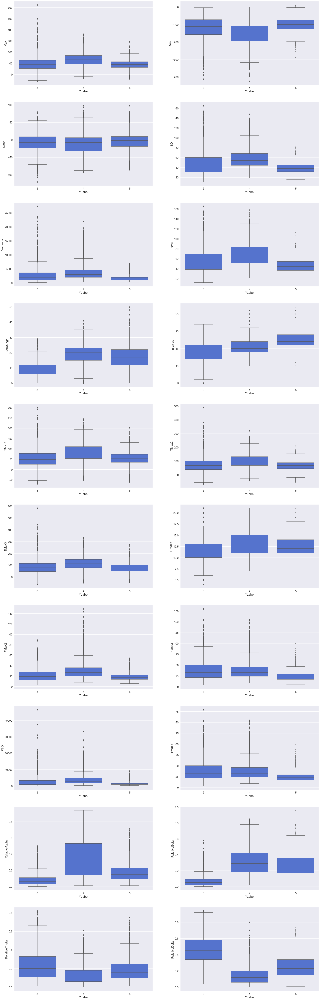

In [103]:
# Plot the boxplots to see the relationships between YLabel and variables
f, axes = plt.subplots(10, 2, figsize=(30, 100))

sns.boxplot(x = 'YLabel', y = 'Max', data = cutdata, ax = axes[0,0], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'Min', data = cutdata, ax = axes[0,1], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'Mean', data = cutdata, ax = axes[1,0], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'SD', data = cutdata, ax = axes[1,1], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'Variance', data = cutdata, ax = axes[2,0], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'RMS', data = cutdata, ax = axes[2,1], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'ZeroXings', data = cutdata, ax = axes[3,0], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'TPeaks', data = cutdata, ax = axes[3,1], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'TMax1', data = cutdata, ax = axes[4,0], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'TMax2', data = cutdata, ax = axes[4,1], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'TMax3', data = cutdata, ax = axes[5,0], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'FPeaks', data = cutdata, ax = axes[5,1], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'FMax2', data = cutdata, ax = axes[6,0], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'FMax3', data = cutdata, ax = axes[6,1], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'PSD', data = cutdata, ax = axes[7,0], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'FMax3', data = cutdata, ax = axes[7,1], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'RelativeAlpha', data = cutdata, ax = axes[8,0], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'RelativeBeta', data = cutdata, ax = axes[8,1], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'RelativeTheta', data = cutdata, ax = axes[9,0], color = 'royalblue')
sns.boxplot(x = 'YLabel', y = 'RelativeDelta', data = cutdata, ax = axes[9,1], color = 'royalblue')

Evident from the boxplots above, there is no single variable that we can spot a visible trend to identify the 3 types.
We shall try 2 approaches.

Approach 1: Instead of using a single few variable, we shall utilise the many variables we have.
To fully utilise them, we shall use a dec tree model to categorise the remaining 3 types of data.

In [104]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
from sklearn.tree import export_graphviz

In [105]:
y = pd.DataFrame(cutdata['YLabel'])
X = pd.DataFrame(cutdata[["Max", "Min", "Mean","SD", 'Variance', 'RMS','ZeroXings','TPeaks',
                           'TMax1', 'TMax2', 'TMax3', 'FPeaks', 'FMax1', 'FMax2', 'FMax3', 'PSD',
                           'RelativeAlpha', 'RelativeBeta', 'RelativeTheta','RelativeDelta']])

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.8695652173913043

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7895652173913044



(3.0, 0.0)

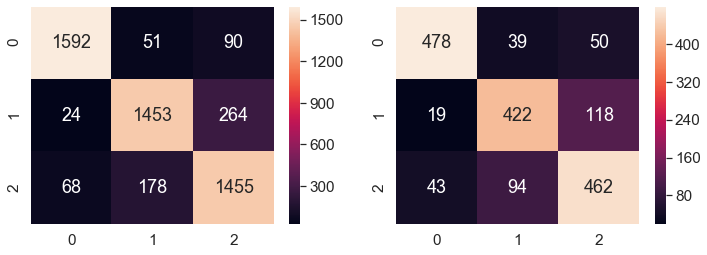

In [106]:
# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25,random_state=0)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 8)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Show Confusion matrix for Train set
f, axes = plt.subplots(1,2, figsize=(12,4))
hm_train = sns.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
# Shift the words in Confusion matrix to the center of each of their areas
b,t = hm_train.get_ylim()
b = b + 0.5
t = t - 0.5
hm_train.set_ylim(b ,t)

# Show Confusion matrix for Test set
hm_test = sns.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])
# Shift the words in Confusion matrix to the center of each of their areas
b,t = hm_test.get_ylim()
b = b + 0.5
t = t - 0.5
hm_test.set_ylim(b ,t)

Approach 2: We will use the correlation matrix to narrow down the variables we want, to remain in the dec tree.

Using multiple variable combinations, we will try to achieve the highest classification accuracy possible.

                 YLabel       Max       Min      Mean        SD  Variance  \
YLabel         1.000000 -0.049753  0.122208  0.036295 -0.184837 -0.186362   
Max           -0.049753  1.000000 -0.311974  0.481655  0.774301  0.737463   
Min            0.122208 -0.311974  1.000000  0.534127 -0.775170 -0.743243   
Mean           0.036295  0.481655  0.534127  1.000000 -0.025166 -0.044237   
SD            -0.184837  0.774301 -0.775170 -0.025166  1.000000  0.965182   
Variance      -0.186362  0.737463 -0.743243 -0.044237  0.965182  1.000000   
RMS           -0.161629  0.502089 -0.777232 -0.296586  0.819384  0.805527   
ZeroXings      0.396416  0.365068 -0.080536  0.233062  0.192518  0.153706   
TPeaks         0.515356 -0.051863  0.245964  0.157454 -0.276447 -0.277471   
TMax1         -0.007636  0.881115 -0.176806  0.639851  0.679454  0.645809   
TMax2         -0.050110  0.920491 -0.234751  0.564548  0.724257  0.689457   
TMax3         -0.073596  0.973247 -0.273110  0.515213  0.751174  0.717072   

(21.0, 0.0)

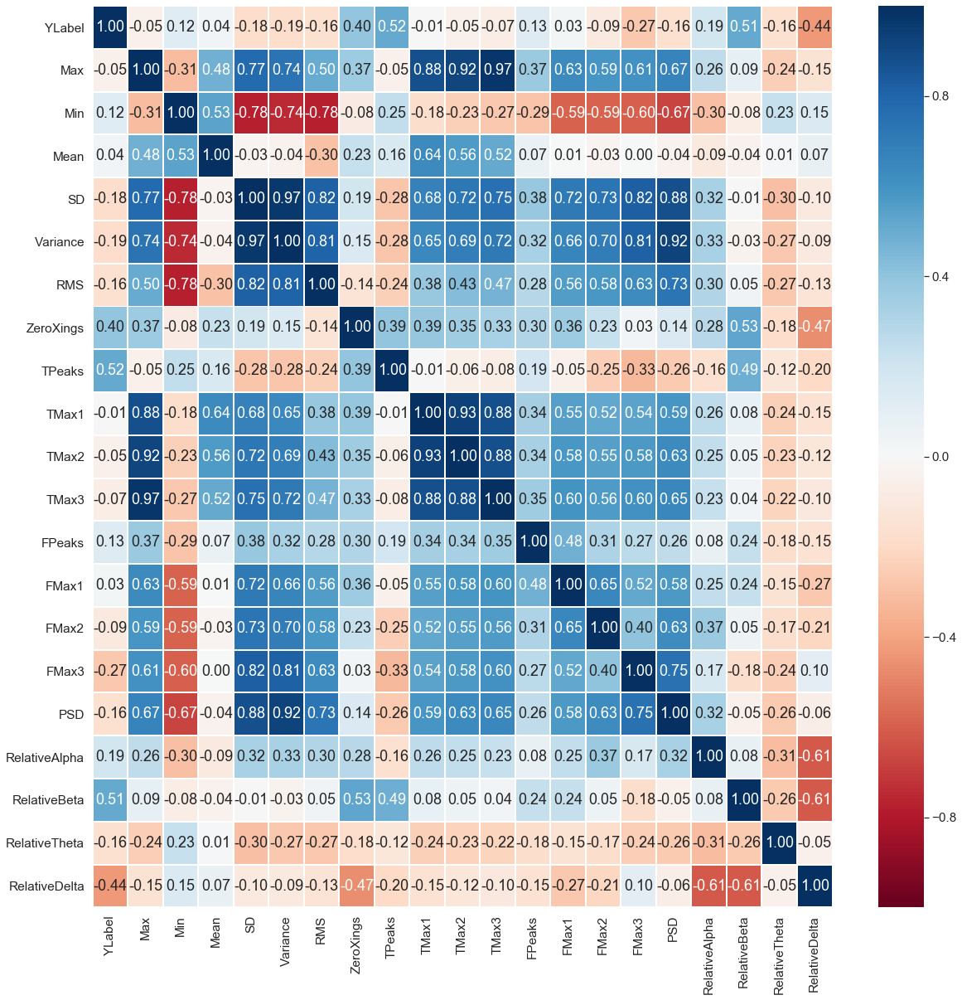

In [107]:
# Correlation Matrix
print(cutdata.corr())

# Heatmap of the Correlation Matrix
f, axes = plt.subplots(1, 1, figsize=(20, 20))
hm = sns.heatmap(cutdata.corr(), vmin = -1, vmax = 1, linewidths = 1,
           annot = True, fmt = ".2f", annot_kws = {"size": 18}, cmap = "RdBu")

b,t = hm.get_ylim()
b = b + 0.5
t = t - 0.5
hm.set_ylim(b ,t)

In [108]:
y = pd.DataFrame(cutdata['YLabel'])
X = pd.DataFrame(cutdata[['Min','SD','Variance','RMS','ZeroXings','TPeaks','FPeaks','PSD',
                          'RelativeAlpha', 'RelativeBeta', 'RelativeTheta','RelativeDelta']])

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9431884057971015

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7866666666666666



(3.0, 0.0)

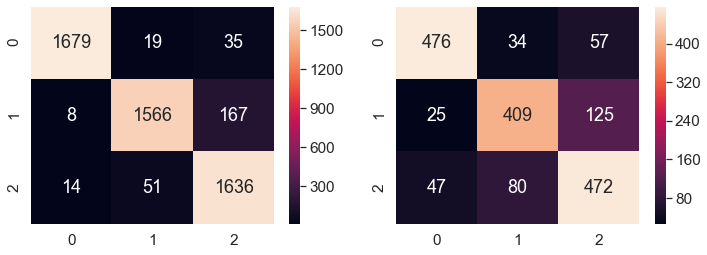

In [109]:
# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25,random_state=0)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 12)  # create the decision tree object
dectree.fit(X_train, y_train)                     # train the decision tree model

# Predict Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Show Confusion matrix for Train set
f, axes = plt.subplots(1,2, figsize=(12,4))
hm_train = sns.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
# Shift the words in Confusion matrix to the center of each of their areas
b,t = hm_train.get_ylim()
b = b + 0.5
t = t - 0.5
hm_train.set_ylim(b,t)

# Show Confusion matrix for Test set
hm_test = sns.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])
# Shift the words in Confusion matrix to the center of each of their areas
b,t = hm_test.get_ylim()
b = b + 0.5
t = t - 0.5
hm_test.set_ylim(b,t)

In [110]:
y = pd.DataFrame(cutdata['YLabel'])
X = pd.DataFrame(cutdata[["SD",'RelativeAlpha', 'RelativeBeta', 'RelativeTheta','RelativeDelta']])

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.8923671497584541

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7652173913043478



(3.0, 0.0)

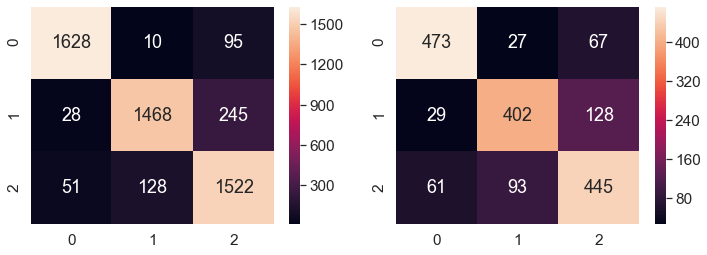

In [111]:
# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25,random_state=0)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 11)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Show Confusion matrix for Train set
f, axes = plt.subplots(1,2, figsize=(12,4))
hm_train = sns.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
# Shift the words in Confusion matrix to the center of each of their areas
b,t = hm_train.get_ylim()
b = b + 0.5
t = t - 0.5
hm_train.set_ylim(b,t)

# Show Confusion matrix for Test set
hm_test = sns.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])
# Shift the words in Confusion matrix to the center of each of their areas
b,t = hm_test.get_ylim()
b = b + 0.5
t = t - 0.5
hm_test.set_ylim(b,t)

# Extreme Gradient Boosting: XGBoost

Exploring another way of classification, we shall utitlise extreme gradient boosting (XGBoost).

It is great in structured or tabular datasets on classification and regression predictive modeling problems.

In [112]:
y = pd.DataFrame(cutdata['YLabel'])
X = pd.DataFrame(cutdata[["Max", "Min", "Mean","SD", 'Variance', 'RMS','ZeroXings','TPeaks',
                           'TMax1', 'TMax2', 'TMax3', 'FPeaks', 'FMax1', 'FMax2', 'FMax3', 'PSD',
                           'RelativeAlpha', 'RelativeBeta', 'RelativeTheta','RelativeDelta']])


# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25,random_state=0)

# Create the XGB classifier - xgb_model.
xgb_model = XGBClassifier(n_estimators=100)

# List the default parameters.
print(xgb_model.get_xgb_params())

#Train and evaluate.
xgb_model.fit(X_train, y_train, eval_set=[((X_train, y_train)),(X_test, y_test)])

{'base_score': 0.5, 'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'gamma': 0, 'learning_rate': 0.1, 'max_delta_step': 0, 'max_depth': 3, 'min_child_weight': 1, 'missing': None, 'n_estimators': 100, 'nthread': 1, 'objective': 'binary:logistic', 'reg_alpha': 0, 'reg_lambda': 1, 'scale_pos_weight': 1, 'seed': 0, 'subsample': 1, 'verbosity': 1}
[0]	validation_0-merror:0.21256	validation_1-merror:0.21913
[1]	validation_0-merror:0.215266	validation_1-merror:0.221449
[2]	validation_0-merror:0.216425	validation_1-merror:0.22087
[3]	validation_0-merror:0.221063	validation_1-merror:0.223768
[4]	validation_0-merror:0.212174	validation_1-merror:0.218551
[5]	validation_0-merror:0.211594	validation_1-merror:0.217971
[6]	validation_0-merror:0.207923	validation_1-merror:0.214493
[7]	validation_0-merror:0.200193	validation_1-merror:0.212754
[8]	validation_0-merror:0.204831	validation_1-merror:0.212174
[9]	validation_0-merror:0.202899	validation_1-merror:0.21

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

Text(0.5, 0, 'Number of iterations')

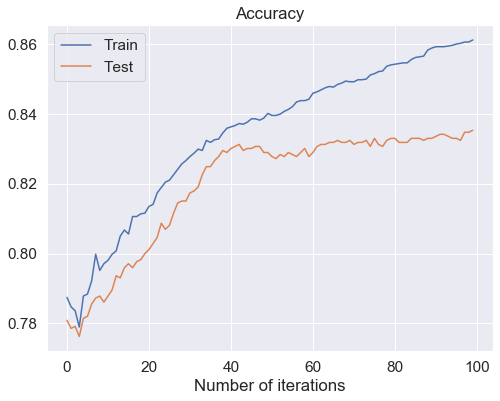

In [113]:
# Plot and display the performance evaluation
xgb_eval = xgb_model.evals_result()
eval_steps = range(len(xgb_eval['validation_0']['merror']))

fig, ax = plt.subplots(1, 1, sharex=True, figsize=(8, 6))

ax.plot(eval_steps, [1-x for x in xgb_eval['validation_0']['merror']], label='Train')
ax.plot(eval_steps, [1-x for x in xgb_eval['validation_1']['merror']], label='Test')
ax.legend()
ax.set_title('Accuracy')
ax.set_xlabel('Number of iterations')

As shown above, there is only miniscule increase in model accuraccy after 70 iterations.
We will select the trained model after 70 iterations, to prevent over-fitting.

Test Accuracy: 0.832463768115942


(3.0, 0.0)

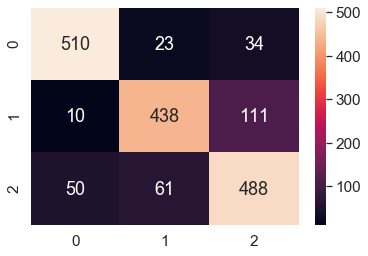

In [114]:
# Select trained model.
n_trees = 70
y_pred = xgb_model.predict(X_test, ntree_limit= n_trees)

# Check the accuracy of the trained model.
accuracy = accuracy_score(y_test, y_pred)

print('Test Accuracy:', accuracy)

# Show Confusion matrix for Test set
f, axes = plt.subplots(0,1, figsize=(6,4))
hm_test = sns.heatmap(confusion_matrix(y_test, y_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
# Shift the words in Confusion matrix to the center of each of their areas
b,t = hm_test.get_ylim()
b = b + 0.5
t = t - 0.5

hm_test.set_ylim(b ,t)

# Adaboost Classifier
Similar to XGBoost, Adaboost uses the boosting technique but via another method, to further improve a decision tree's functions.

Test Accuracy: 0.7808695652173913


(3.0, 0.0)

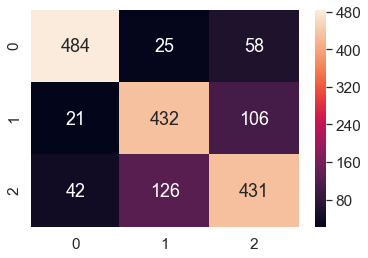

In [115]:
# Load data
y = pd.DataFrame(cutdata['YLabel'])
X = pd.DataFrame(cutdata[["Max", "Min", "Mean","SD", 'Variance', 'RMS','ZeroXings','TPeaks',
                           'TMax1', 'TMax2', 'TMax3', 'FPeaks', 'FMax1', 'FMax2', 'FMax3', 'PSD',
                           'RelativeAlpha', 'RelativeBeta', 'RelativeTheta','RelativeDelta']])


# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25,random_state=0)

# Create adaboost classifer object
abc = AdaBoostClassifier(n_estimators=100,
                         learning_rate=1)
# Train Adaboost Classifer
model = abc.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = model.predict(X_test)

# Model Accuracy for test dataset
accuracy = metrik.accuracy_score(y_test, y_pred)
print("Test Accuracy:", accuracy)

# Show Confusion matrix for Test set
f, axes = plt.subplots(0,1, figsize=(6,4))
hm_test = sns.heatmap(confusion_matrix(y_test, y_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
# Shift the words in Confusion matrix to the center of each of their areas
b,t = hm_test.get_ylim()
b = b + 0.5
t = t - 0.5
hm_test.set_ylim(b,t)

## Model Stacking with Vecstack

In [116]:
y = pd.DataFrame(cutdata['YLabel'])
X = pd.DataFrame(cutdata[["Max", "Min", "Mean","SD", 'Variance', 'RMS','ZeroXings','TPeaks',
                           'TMax1', 'TMax2', 'TMax3', 'FPeaks', 'FMax1', 'FMax2', 'FMax3', 'PSD',
                           'RelativeAlpha', 'RelativeBeta', 'RelativeTheta','RelativeDelta']])

models = [ExtraTreesClassifier(random_state=0, n_jobs=-1, 
                         n_estimators=100, max_depth=8),
          RandomForestClassifier(random_state=0, n_jobs=-1, 
                           n_estimators=100, max_depth=8),
          XGBClassifier(random_state=0, n_jobs=-1, learning_rate=0.1, 
                  n_estimators=100, max_depth=8)]

In [117]:
S_train, S_test = stacking(models,                     # list of models
                           X_train, y_train, X_test,   # data
                           regression=False,           # classification task (if you need 
                                                       #        regression - set to True)
                           mode='oof_pred_bag',        # mode: oof for train set, predict test 
                                                       #       set in each fold and vote
                           needs_proba=False,          # predict class labels (if you need 
                                                       #       probabilities - set to True) 
                           save_dir=None,              # do not save result and log (to save 
                                                       #       in current dir - set to '.')
                           metric=accuracy_score,      # metric: callable
                           n_folds=10,                 # number of folds
                           stratified=True,            # stratified split for folds
                           shuffle=True,               # shuffle the data
                           random_state=0,             # ensure reproducibility
                           verbose=2)                  # print all info

task:         [classification]
n_classes:    [3]
metric:       [accuracy_score]
mode:         [oof_pred_bag]
n_models:     [3]

model  0:     [ExtraTreesClassifier]
    fold  0:  [0.80384615]
    fold  1:  [0.81274131]
    fold  2:  [0.80115830]
    fold  3:  [0.82011605]
    fold  4:  [0.82398453]
    fold  5:  [0.84332689]
    fold  6:  [0.81044487]
    fold  7:  [0.80077369]
    fold  8:  [0.82978723]
    fold  9:  [0.83945841]
    ----
    MEAN:     [0.81856375] + [0.01464043]
    FULL:     [0.81855072]

model  1:     [RandomForestClassifier]
    fold  0:  [0.81538462]
    fold  1:  [0.81853282]
    fold  2:  [0.80888031]
    fold  3:  [0.81818182]
    fold  4:  [0.82011605]
    fold  5:  [0.84526112]
    fold  6:  [0.82011605]
    fold  7:  [0.82978723]
    fold  8:  [0.84139265]
    fold  9:  [0.84332689]
    ----
    MEAN:     [0.82609796] + [0.01230564]
    FULL:     [0.82608696]

model  2:     [XGBClassifier]
    fold  0:  [0.82307692]
    fold  1:  [0.81274131]
    fold  2:  

In [118]:
# Initialize 2nd level model
model = XGBClassifier(random_state=0, n_jobs=-1, learning_rate=0.1, 
                      n_estimators=100, max_depth=8)
    
# Fit 2nd level model
model = model.fit(S_train, y_train)

# Predict
y_pred = model.predict(S_test)

# Final prediction score
print('Final prediction score: [%.8f]' % accuracy_score(y_test, y_pred))

Final prediction score: [0.83014493]
